Made by Seojin Yoon

# Dependency

- setuptools
- wheel
- cython
- numpy

# Dependent Tool

- ImageMagick: Flatmap ROI Rendering
- FreeSurfer: Surface segmentation and generation  
install guide: https://surfer.nmr.mgh.harvard.edu/fswiki/FS7_linux, https://freesurfer.net/fswiki/BuildRequirements, https://surfer.nmr.mgh.harvard.edu/fswiki/LinuxInstall, https://surfer.nmr.mgh.harvard.edu/fswiki/UpdateFreeview, https://www.youtube.com/watch?v=P2_sbNFvCek

- Blender: Surface manipulation for flattening // need to use below version than 2.80 //   
issue: https://github.com/gallantlab/pycortex/issues/379  
download: https://download.blender.org/release/Blender2.79/
- Inkscape: ROI definition and manipulation  
tutorial: https://www.youtube.com/watch?v=-_KJZPOYBeA&t=92s


# Why we use surface Analysis?

The brain has a crumpled structure but it has folding structure. If you unfold the brain using folding-structure, then you can see the brain more clealy. In other words, the brain's organization when viewed as 2d plane looks better than Volume(3d). This trend is more evident in the visual cortex.


# Process
1. Segmentation(reference: https://gallantlab.github.io/segmentation_guide.html?highlight=start#)

This process uses Freesurfer to generate the surface files 

- call segment.init_subject (If this function is called then Freesurfer does recon-all)
- segmentation edit: call cortex.segment.edit_segmentation(To check segmentation is well constructed) (기존 수정 함수였던 fix_wm, fix_pia는 deprecated 됨)  

2. Cutting and Flattening

- Reference1: https://afni.nimh.nih.gov/pub/dist/edu/human_freesurfer/fs_hands-on/fs_hands-on.pdf  
See Cutting & Flattening Section.

- Reference2: https://surfer.nmr.mgh.harvard.edu/fswiki/FreeSurferOccipitalFlattenedPatch

////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////

- First, You must cut surface using freeview.  
- Next, Run mris_flatten command for making flatten patch file.  
- Last, Run import_flat function in python for making gii file from flatten patch file.

Detail Cutting surface)
- Run this command, tksurferfv [subj_name] [hemisphere] inflated
- "Click cut" button and make points clicking mouse point.
- "Click cut line" button. You can see the brain is cutted.
- If you want to cut brain by area, then click points more than 3 and click cut closed line.
- If you want to unfill the cutted area, then click cut button again(release cut) and select the any points outside of the area and click cut button again and click "cut closed line" button and click "Fill uncut Area" button.
- Save the patchas ?h.full.patch.3d

3. Align  
To project functional data onto anatomical surfaces accurately the functional data must first be coregistered with the anatomical surface.
- call cortex.align.automatic (You need to call this function twice per subject over left hemishphere, right hemishphere

4. Viewing
    - 3D Viewer: call cortex.webshow
    - 2D Viweer: call cortex.quickshow


# Issue

- Pycortex Documentation is not updated(so hard to implement).
- Dependent Tool is too many and These tools are contrained to specific version.
- Information is too much fragmented.
- If error is occurred in align, then check header (qform_code, sform_code, datatype).
- Error is occurred when applying function cut_surface to both hemishperes(lh, rh) https://github.com/gallantlab/pycortex/issues/331

# Configuration

## Pycortex Setting
- cortex.database.default_filestore: db path of the pycortex library(output path)

## Freesurfer Setting in Linux(environment variable)
- FREESURFER_HOME: freesurfer binary path ex) /usr/local/freesurfer/7.2.0
- FSFAST_HOME: freesurfer fsfast path ex) /usr/local/freesurfer/7.2.0/fsfast
- FSF_OUTPUT_FORMAT: output file format ex) nii.gz
- SUBJECTS_DIR: subject dir ex) /usr/local/freesurfer/7.2.0/subjects
- MNI_DIR: mni dir ex) /usr/local/freesurfer/7.2.0/mni


# Reference

## Pycortex
- Paper: https://www.frontiersin.org/articles/10.3389/fninf.2015.00023/full
- Documentation: https://gallantlab.github.io/
- Github: https://github.com/gallantlab/pycortex


## Freesurfer
- course: https://andysbrainbook.readthedocs.io/en/latest/FreeSurfer/FreeSurfer_Introduction.html
- license: https://surfer.nmr.mgh.harvard.edu/fswiki/License

- Gifti: GIfTI is the Geometry format under the Neuroimaging Informatics Technology Initiative (NIfTI). Basically, it is the surface-file format complement to the NIfTI volume-file format .nii. Programs which support the Gifti format, intended to allow exchange of each others surface files, include: Freesurfer, Caret, BrainVISA, Brain Voyager, CRkit, VisTrails and AFNI. 

- Directory structure: 
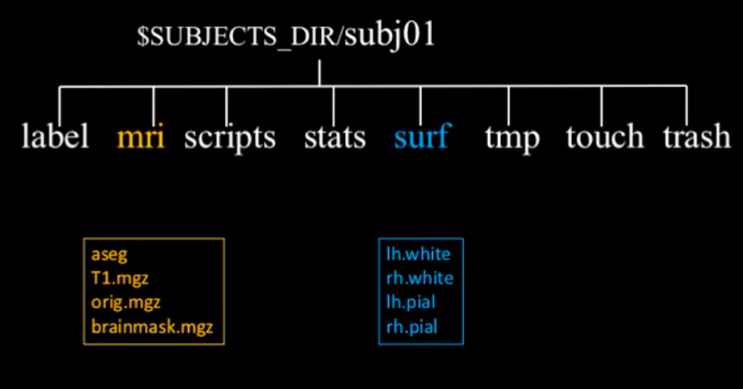

- File Formats: http://www.grahamwideman.com/gw/brain/fs/surfacefileformats.htm
- Label Directory: https://surfer.nmr.mgh.harvard.edu/fswiki/LabelsClutsAnnotationFiles


## Recon-all
- lecture(recon-all): https://www.youtube.com/watch?v=zeFPx0fMXRQ

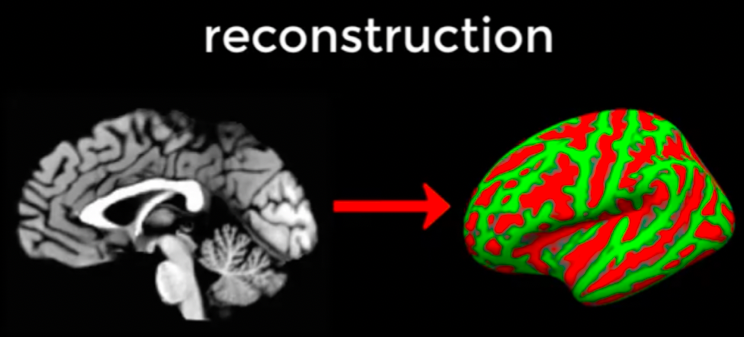

Convert from Volume based structure into Triangular mesh.

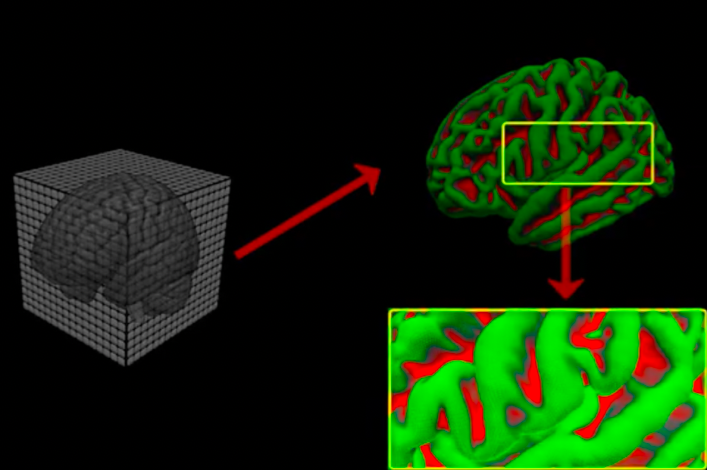

Vertex: The part where the triangles overlap is called a vertex.
Edge: The part connected between vertices is called an edge.
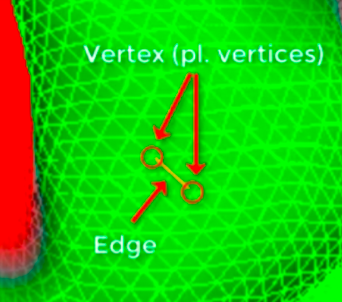

In the vertex, there are many informations.(Volume, thickness, Area, Curvature)  
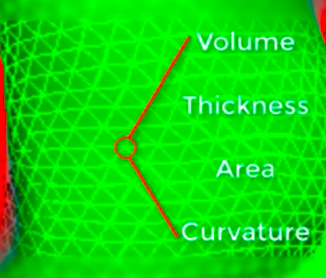

recon-all process contains segmentation + aligning
For surface-based registration, segmenting white, pial from orig.mgz.

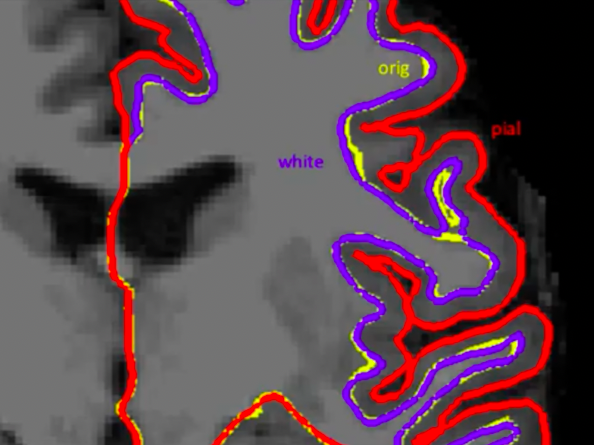

Segmentation sub-cortical structure.

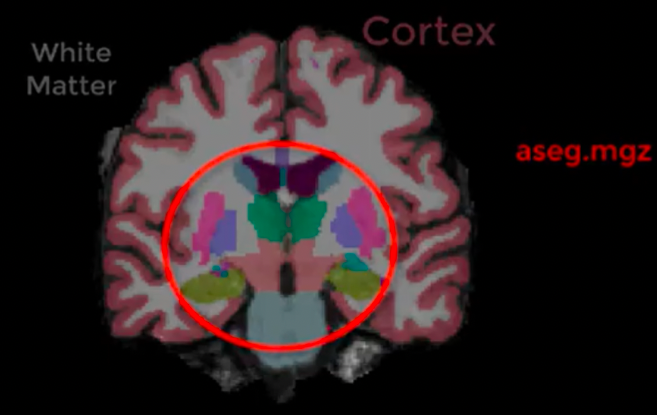

recon-all process in Freesurfer is that matchs specific bhrain to fs-average brain.
This process considers the human brain as planet. A Specific location in a planet has mountain and valley but planet looks like Sphere.  
Using this pattern, We can consider a brain as planet, gyrus to mountain and sulcus to valley.(*Spherical morph*) and align moutains and valleys into average planet pattern.

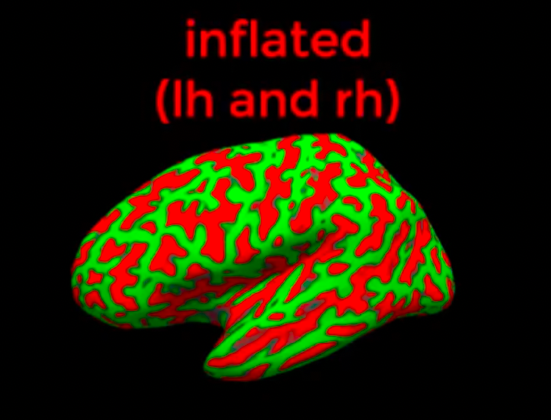
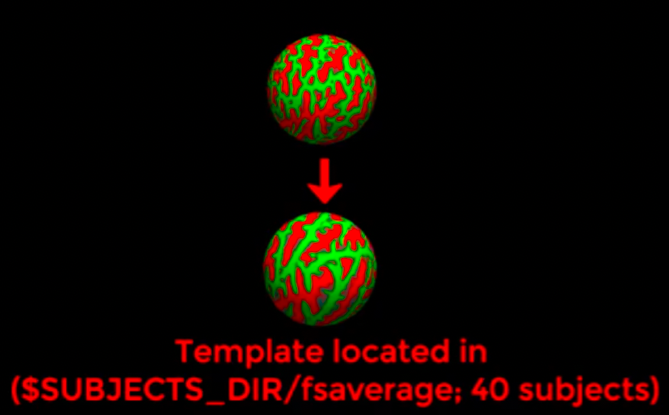
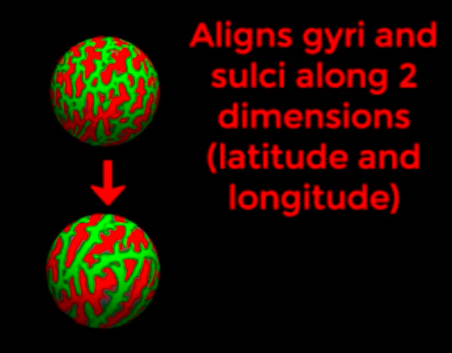

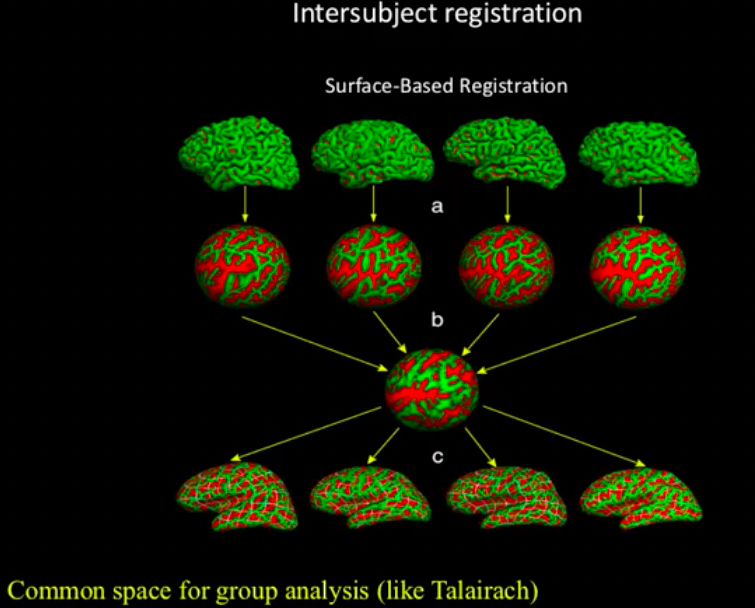

## FreeView
- Demo: https://www.youtube.com/watch?v=Mv-ECowxq2o
- tksurferfv: Using freeview, We can use command like tksurfer. tksurfer [subj_name] [lh or rh] [inflated, etc] ex) tksurferfv HP01 lh inflated
- Load segmentation file ex) freeview -v bert/mri/aparc+aseg.mgz
- Load T1 with label ex) freeview -v bert/mri/T1.mgz -l bert/label/rh.cortex.label
- Load surface file with annotation ex) freeview --surface burt/surf/lh.inflated:annot=burt/label/lh.aparc.annot

## ROI  
https://www.slideserve.com/latona/working-with-freesurfer-regions-of-interest-rois-surfer-nmr-mgh-harvard

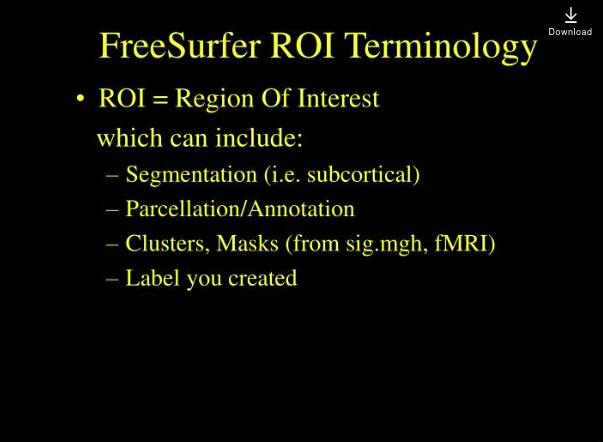
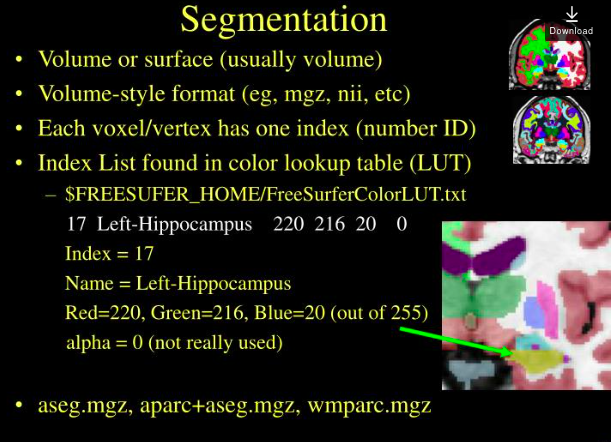
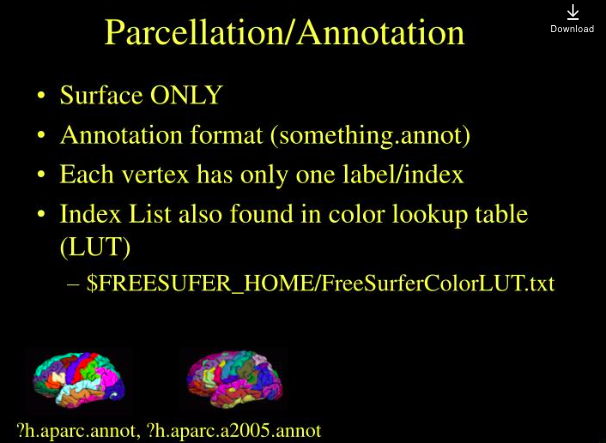
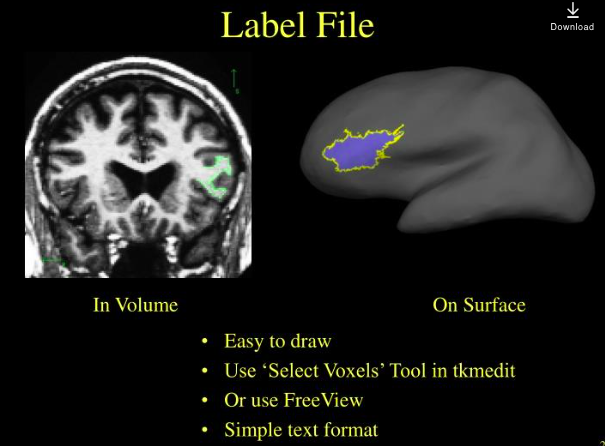

### Autogenerated ROI

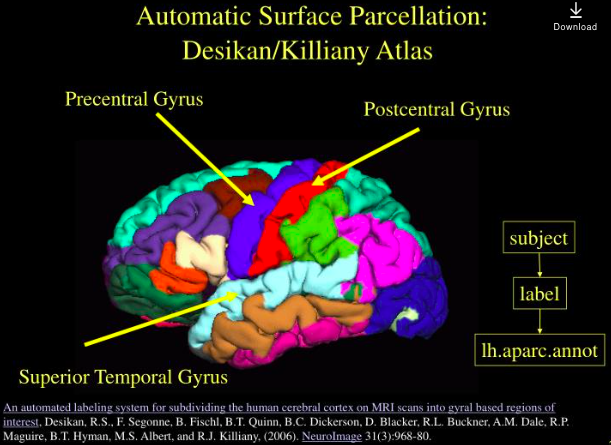
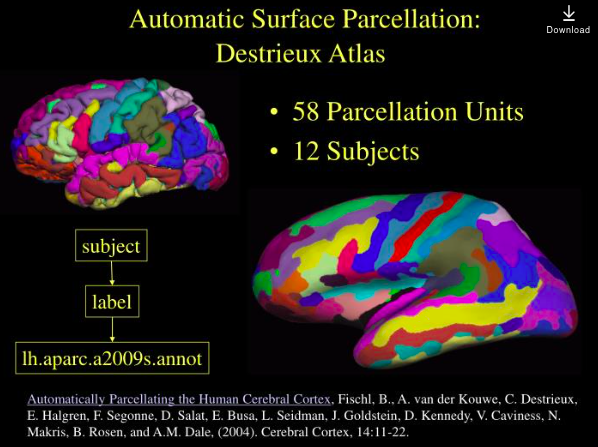

### Labels

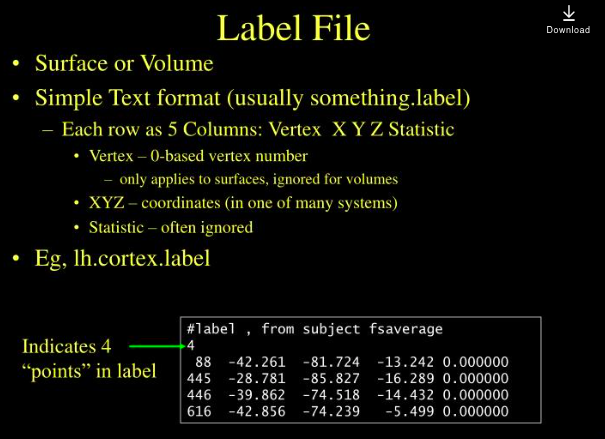

### Stats

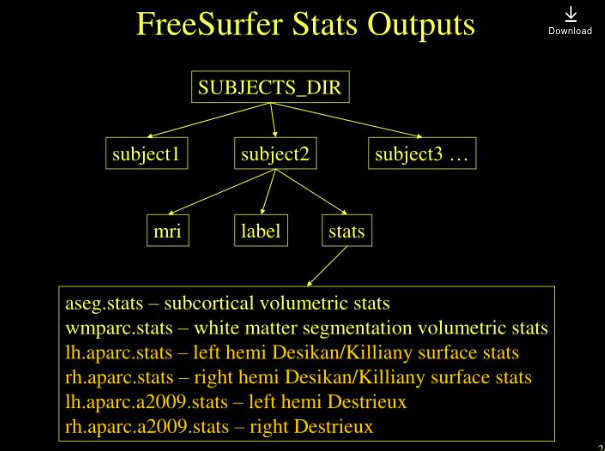
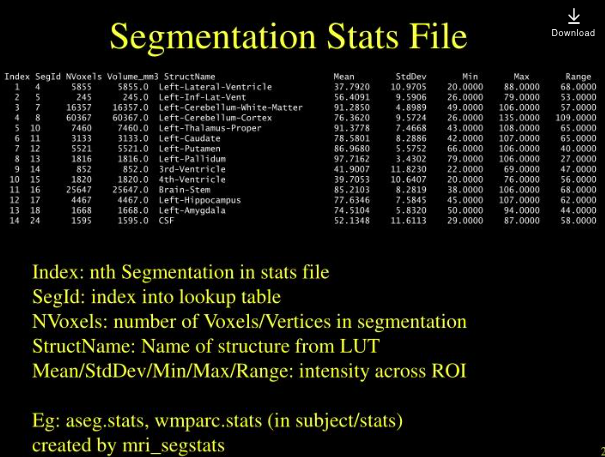
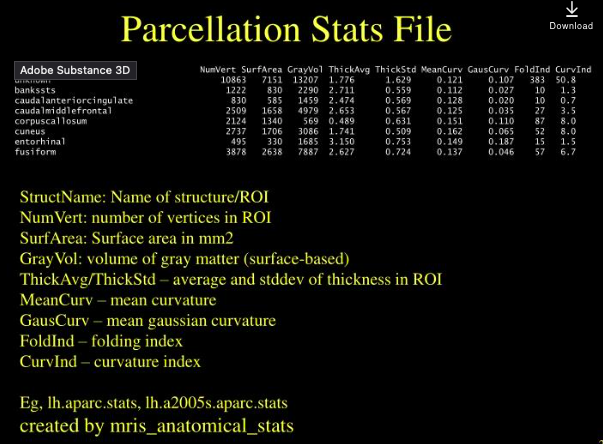


### Surfice
You can view .gii file in surfice program.

- Demo: https://neurostars.org/t/displaying-surface-files-generated-by-neurovault/6693

ex)

**Run surfice program - command: surfice**  
**In surfice menu, Choose Scripting -> New**

Write this code.

import os  
import gl 

surfaces_dir_path = "/home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP01/surfaces"  
gii_file_name = "inflated_lh.gii"  
gii_file_path = os.path.join(surfaces_dir_path, gii_file_name)

gl.resetdefaults()  
gl.meshload(gii_file_path)


### Cutting and Flattening

- Hand-on: https://afni.nimh.nih.gov/pub/dist/edu/human_freesurfer/fs_hands-on/fs_hands-on.pdf
- Documents: https://surfer.nmr.mgh.harvard.edu/fswiki/FreeSurferOccipitalFlattenedPatch
- Monkey brain: https://prime-re.github.io/structural/surfaces_and_flatmaps_notebook/Surfaces_and_Flatmaps.html

# Description

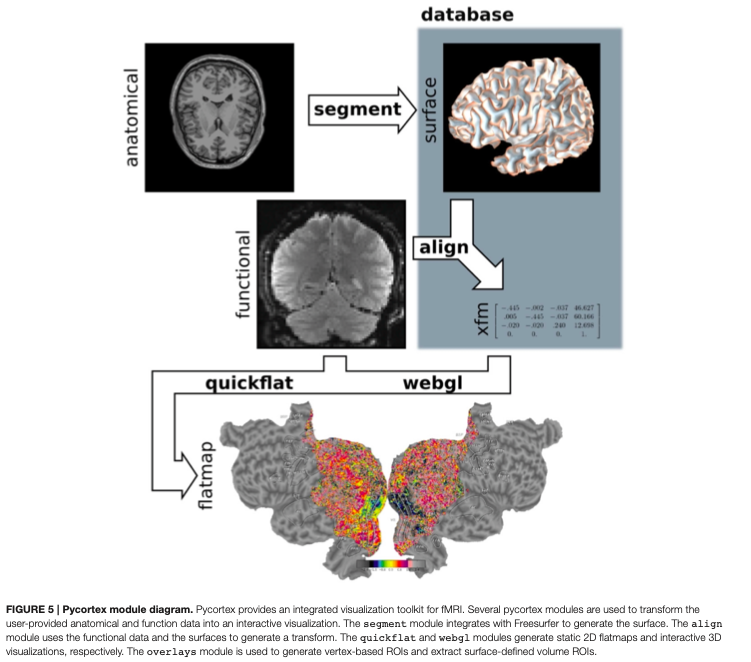

# ROI

- If you want to use MNI space ROI: https://github.com/gallantlab/pycortex/issues/170
- If you want to use Freesurfer ROI: https://github.com/gallantlab/pycortex/issues/312

All overlay structure is stored in overlays.svg file (located in cortex.database.default_filestore/subj_name)

You must edit overlays.svg file and make ROI using <svg:g> format and label id and name of the format within svg file.  
<svg:g> is a group format. You need to check how to make group in Inkscape - https://inkscape-manuals.readthedocs.io/en/latest/grouping.html 

The grouping function shortcut is ctrl + G

"""  
Reference: 

Overlay Class structure

SVGOverlay <- cortex.db.get_overlay("HP01")  
    layers  <- load all svg
        Overlay <- cortex.db.get_overlay("HP01").layers["rois"]  
            Shape <- cortex.db.get_overlay("HP01").layers["rois"]["rh.MT_exvivo"]
            svgobject <- reference to SVGOverlay
                
"""

In [3]:
import cortex
import numpy as np
np.random.seed(1234)
import matplotlib.pyplot as plt
%matplotlib inline
import os
import mne

port = 16006

print(cortex.database.default_filestore)

import cortex
from cortex import segment, freesurfer
import sys
import nibabel as nb

port = 16006

sys.path.append("/home/seojin/HR/new_sj_2/Module")
import sj_file_system

/home/sungbeenpark/anaconda3/envs/GA/share/pycortex/db


# Demo

## Demo - 3D plotting

In [4]:
view = cortex.webshow(data = cortex.Volume.random("S1", "fullhead"), port = port)

Generating new ctm file...
wm
wm
Generating curvature surface info...


/home/sungbeenpark/anaconda3/envs/GA/lib/python3.9/site-packages/scipy/sparse/linalg/dsolve/linsolve.py:318: SparseEfficiencyWarning: splu requires CSC matrix format
  warn('splu requires CSC matrix format', SparseEfficiencyWarning)


inflated
inflated
Started server on port 16006
Stopping server


## Demo - 2D plotting

Generating a flatmap cache
Generating a flatmap cache
Unable to init server: 연결할 수 없습니다: 연결이 거부됨
** (inkscape:115484): WARNING **: 15:17:57.216: 파일 형식 자동인식 실패, SVG형식으로 파일을 읽습니다.
Background RRGGBBAA: ffffff00
Area 0:0:1960.5:1024 exported to 1960 x 1024 pixels (96 dpi)
Unable to init server: 연결할 수 없습니다: 연결이 거부됨
** (inkscape:115628): WARNING **: 15:17:57.957: 파일 형식 자동인식 실패, SVG형식으로 파일을 읽습니다.
Background RRGGBBAA: ffffff00
Area 0:0:1960.5:1024 exported to 1960 x 1024 pixels (96 dpi)


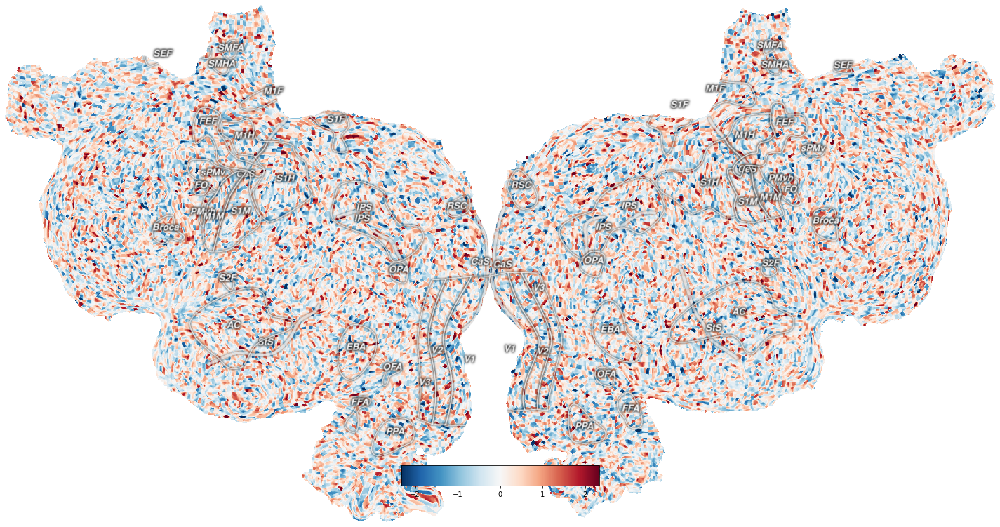

In [5]:
# Create a random pycortex Volume
volume = cortex.Volume.random(subject='S1', xfmname='fullhead')

# Plot a flatmap with the data projected onto the surface
# Highlight the curvature and display the sulci
_ = cortex.quickflat.make_figure(volume,
                                 with_curvature=True,
                                 with_sulci=True)


In [6]:
overlay_svg = "/home/sungbeenpark/anaconda3/envs/GA/share/pycortex/db/S1/overlays.svg"

Unable to init server: 연결할 수 없습니다: 연결이 거부됨
** (inkscape:115838): WARNING **: 15:18:13.741: 파일 형식 자동인식 실패, SVG형식으로 파일을 읽습니다.
Background RRGGBBAA: ffffff00
Area 0:0:1960.5:1024 exported to 1960 x 1024 pixels (96 dpi)
Unable to init server: 연결할 수 없습니다: 연결이 거부됨
** (inkscape:115982): WARNING **: 15:18:14.499: 파일 형식 자동인식 실패, SVG형식으로 파일을 읽습니다.
Background RRGGBBAA: ffffff00
Area 0:0:1960.5:1024 exported to 1960 x 1024 pixels (96 dpi)


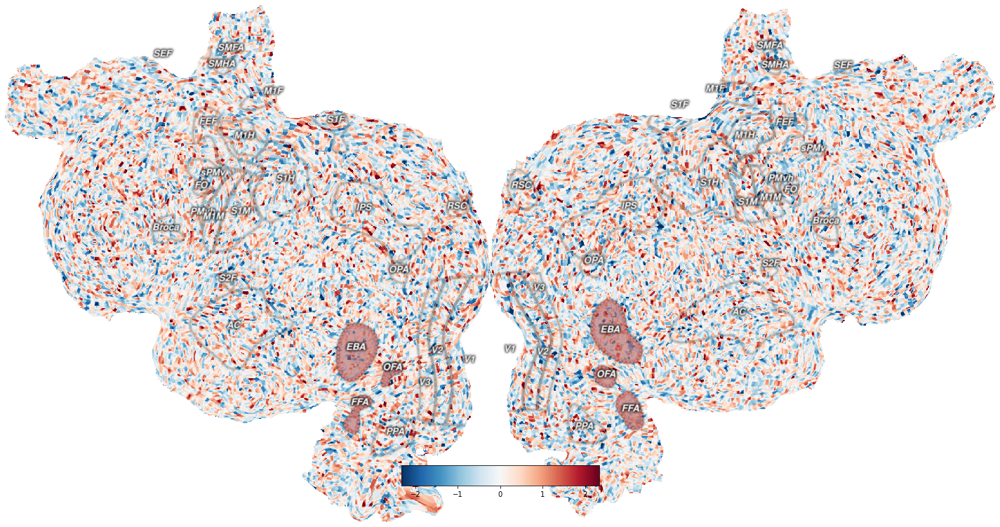

In [7]:
# Create a random volume
volume = cortex.Volume.random(subject='S1', xfmname='fullhead')

# Create basic figure, with rois, labels, sulci all off
fig = cortex.quickflat.make_figure(volume,
                                   with_curvature=True,
                                   with_rois=False,
                                   with_labels=False,
                                   with_sulci=False)


# Add all rois, with a particular color scheme:
_ = cortex.quickflat.composite.add_rois(fig, volume,
                                        with_labels=True,
                                        linewidth=1,
                                        linecolor=(0.8, 0.8, 0.8))

# Highlight face- and body-selective ROIs:
_ = cortex.quickflat.composite.add_rois(fig, volume,
                                        roi_list=['FFA', 'EBA', 'OFA'],  # (This defaults to all rois if not specified)
                                        with_labels=True,
                                        linewidth=5,
                                        linecolor=(0.9, 0.5, 0.5),
                                        roifill=(0.9, 0.5, 0.5),
                                        fillalpha=0.35,
                                        dashes=(5, 3)                    # Dash length & gap btw dashes
                                        )


# Apply my data

## Surface Segmentation

Freesurfer: automatically discern where white matter and gray matter
Blender: 3D Modeling program

https://www.youtube.com/watch?v=Pyw0lnHqLzM  
-s: subject option, -i: input, -all: preprocessing  
명령어로 segmentation 하고 싶다면 다음과 같이 입력하면 된다.  
recon-all -s [subj_name] -i [nii path] -all

In [8]:
import cortex
from cortex import segment
from cortex import freesurfer
import os 
import sys
import nibabel as nb
sys.path.append("/home/seojin/HR/new_sj_2/Module")

import sj_file_system
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

port = 16006

subj_name = "HP01"
patch_name = "full" #"full.test" # "flatten"

anat_file_name = sj_file_system.str_join(["anat_final", subj_name, "nii", "gz"], deliminator = ".") # anatomy file name
fmri_dir_path = os.path.join("/mnt/sdb2/seojin/HR/exp_blueprint_0324v4/fMRI_data/output", subj_name, "preprocessed") # fmri directory path

xfm_name = "rest" # You can set any value
fmri_reference = os.path.join("/mnt/sdb2/seojin/HR/exp_blueprint_0324v4/fMRI_data/output", subj_name, "others", "reference_img.nii") # reference mri


In [15]:
from glob import glob
from os.path import join
glob(join(fmri_dir_path, '*'))

['/mnt/sdb2/seojin/HR/exp_blueprint_0324v4/fMRI_data/output/HP01/preprocessed/anat_final.HP01.nii',
 '/mnt/sdb2/seojin/HR/exp_blueprint_0324v4/fMRI_data/output/HP01/preprocessed/pb02.HP01.rPost_rest.volreg+tlrc.BRIK.gz',
 '/mnt/sdb2/seojin/HR/exp_blueprint_0324v4/fMRI_data/output/HP01/preprocessed/pb02.HP01.rPre_rest.volreg+tlrc.BRIK.gz',
 '/mnt/sdb2/seojin/HR/exp_blueprint_0324v4/fMRI_data/output/HP01/preprocessed/pb02.HP01.rRun1.volreg+tlrc.BRIK.gz',
 '/mnt/sdb2/seojin/HR/exp_blueprint_0324v4/fMRI_data/output/HP01/preprocessed/pb02.HP01.rRun2.volreg+tlrc.BRIK.gz',
 '/mnt/sdb2/seojin/HR/exp_blueprint_0324v4/fMRI_data/output/HP01/preprocessed/pb02.HP01.rRun3.volreg+tlrc.BRIK.gz',
 '/mnt/sdb2/seojin/HR/exp_blueprint_0324v4/fMRI_data/output/HP01/preprocessed/pb02.HP01.rRun4.volreg+tlrc.BRIK.gz',
 '/mnt/sdb2/seojin/HR/exp_blueprint_0324v4/fMRI_data/output/HP01/preprocessed/pb03.HP01.rPost_rest.blur+tlrc.BRIK.gz',
 '/mnt/sdb2/seojin/HR/exp_blueprint_0324v4/fMRI_data/output/HP01/preprocesse

In [9]:
# Init subject 
# Run the first initial segmentation for a subject’s anatomy. This function runs autorecon-all
segment.init_subject(subj_name, os.path.join(fmri_dir_path, anat_file_name))

Calling:
%recon-all -i /mnt/sdb2/seojin/HR/exp_blueprint_0324v4/fMRI_data/output/HP01/preprocessed/anat_final.HP01.nii.gz -s HP01


FileNotFoundError: [Errno 2] No such file or directory: 'recon-all'

In [ ]:
# To check segmentation is fine
cortex.segment.edit_segmentation(subj_name)

In [15]:
# if segmentation is well suited, then import subject into pycortex from freesurfer
cortex.freesurfer.import_subj(subj_name)

<function cortex.freesurfer.import_subj(fs_subject, cx_subject=None, freesurfer_subject_dir=None, whitematter_surf='smoothwm')>

## Flattening

In [3]:
# Initializes an interface to cut the segmented surface for flatmapping
# if both hemispheres have been flattened, then flat image is made in cortex.database.default_filestore + subject_name + surfaces

"""
Hard to Use... because this fuction uses blender software but this software's reference is bad.

Please use tksurferfv
"""
# segment.cut_surface(cx_subject = subj_name, hemi = "rh")

'\nHard to Use...\n\nPlease use tksurferfv\n'

In [257]:
# If both hemisphere is cutted, then call this function to import file from freesurfer dir
freesurfer.import_flat(subj_name, 
                       patch = patch_name, 
                       cx_subject = subj_name,
                       flat_type = 'freesurfer',
                       freesurfer_subject_dir = "/usr/local/freesurfer/7.2.0/subjects",
                       clean = True)

flatmap vertex locations for this subject, and will result
in deletion of the overlays.svg file and all cached info
for this subject (because flatmaps will fundamentally change).
Proceed? [y]/n: y
b'created by seojin on Fri Nov 19 10:10:22 2021\n'
saving to /home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP02/surfaces/flat_lh.gii
b'created by seojin on Fri Nov 19 10:10:22 2021\n'
saving to /home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP02/surfaces/flat_rh.gii


FileNotFoundError: [Errno 2] No such file or directory: '/home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP02/overlays.svg'

In [258]:
"""
This returns the points and polygons of the given subject and surface type. 
Hemisphere defaults to “both”, and 
since merge is true, they are vertically stacked left, then right. 
The polygon indices are shifted up for the right hemisphere to make a single unified geometry.

type: (fiducial, inflated, veryinflated, hyperinflated, superinflated, flat)
"""
left, right = cortex.db.get_surf(subject = subj_name, type = 'flat', hemisphere = "both", merge=False)
lpts, lpolys = left
rpts, rpolys = right

## Align

In [259]:
"""
If you call this function, then makes file in os.path.join(cortex.database.default_filestore, xfm_name)

The file name is like matrices.xfm.
"""
cortex.align.automatic(subj_name, xfm_name, fmri_reference)

Running freesurfer BBR


/home/seojin/anaconda3/envs/seojin/lib/python3.9/site-packages/cortex/align.py:260: UserWarning: Defaults changed in pycortex 1.3. Now automatic alignment uses Freesurfer's bbregister and mri_coreg for initialization.
  warnings.warn("Defaults changed in pycortex 1.3. Now automatic alignment "


OSError: Error calling freesurfer BBR!

In [21]:
xfm_obj = cortex.db.get_xfm(subj_name, xfm_name, xfmtype='coord')

# Transform matrix
xfm_obj.xfm

[[0.4999989867210388,
  -0.0009428502526134255,
  -1.946381598827429e-05,
  47.47649527245267],
 [0.000942713348194957,
  0.49998968839645386,
  -0.003056218847632408,
  65.87508204916958],
 [2.5226683646906164e-05,
  0.003056176006793976,
  0.4999905824661255,
  38.752131719633326],
 [0.0, 0.0, 0.0, 1.0]]

# First show

In [341]:
test_data = np.ones(reference_img_shape)
test_data.shape

# Volume data
vol_data = cortex.Volume(data = test_data, subject = subj_name, xfmname = xfm_name)

In [ ]:
"""
In result, overlays.svg file is generated.
"""

view = cortex.webshow(data = vol_data, port = port)
None

# First overlays.svg

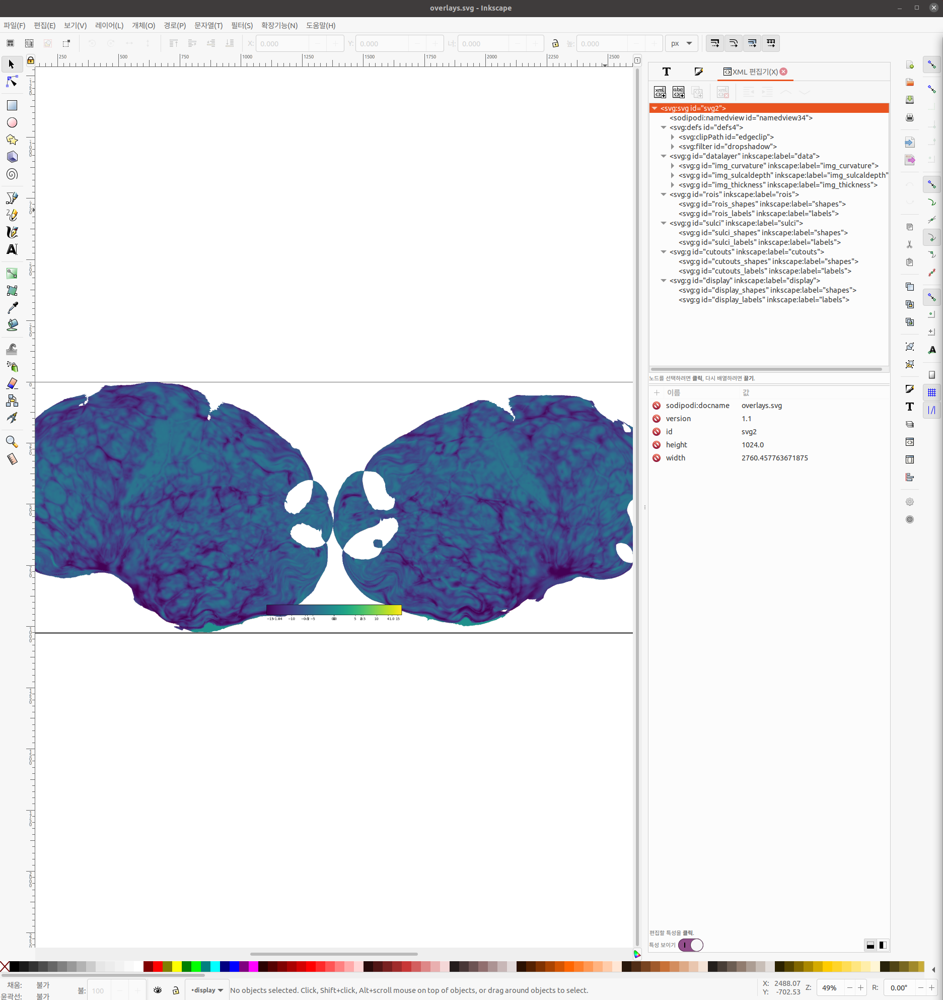

## ROI - Annotation

In [124]:
"""
Annotation

# labels: annotation id at each vertex.
# ctab: RGBT + label id colortable array
# names: The name of the labe
"""

l_labels, l_ctab, l_names = nb.freesurfer.io.read_annot("/usr/local/freesurfer/7.2.0/subjects/HP01/label/lh.aparc.annot")
r_labels, r_ctab, r_names = nb.freesurfer.io.read_annot("/usr/local/freesurfer/7.2.0/subjects/HP01/label/rh.aparc.annot")


In [125]:
left, right = cortex.db.get_surf(subj_name, "flat", "both")
lpts, lpolys = left
rpts, rpolys = right

In [126]:
"""
Check same vertex structure
"""
if lpts.shape[0] == l_labels.shape[0]:
    print("Same vertex in Left hemisphere")
    
if rpts.shape[0] == r_labels.shape[0]:
    print("Same vertex in Right hemisphere")

Same vertex in Left hemisphere
Same vertex in Right hemisphere


In [127]:
ROI = cortex.dataset.Vertex(np.r_[l_labels, r_labels], subj_name)

In [34]:
"""
You can see that the roi is well defined using webshow
"""
cortex.webshow(ROI, port = port)

Started server on port 16006


<JS: window.viewer>

Stopping server


In [128]:
"""
Add roi

if the function is called succesful, overlays.avg file will be changed in pycortex db

To use Inkscape, You need to run this code in linux terminal()
"""
cortex.add_roi(ROI, name="aparc", open_inkscape=True)

Create new file: /home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP01/overlays.svg
cortex.svgoverlay /home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP01/overlays.svg
cortex.svgoverlay /home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP01/overlays.svg
cortex.svgoverlay /home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP01/overlays.svg
cortex.svgoverlay /home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP01/overlays.svg


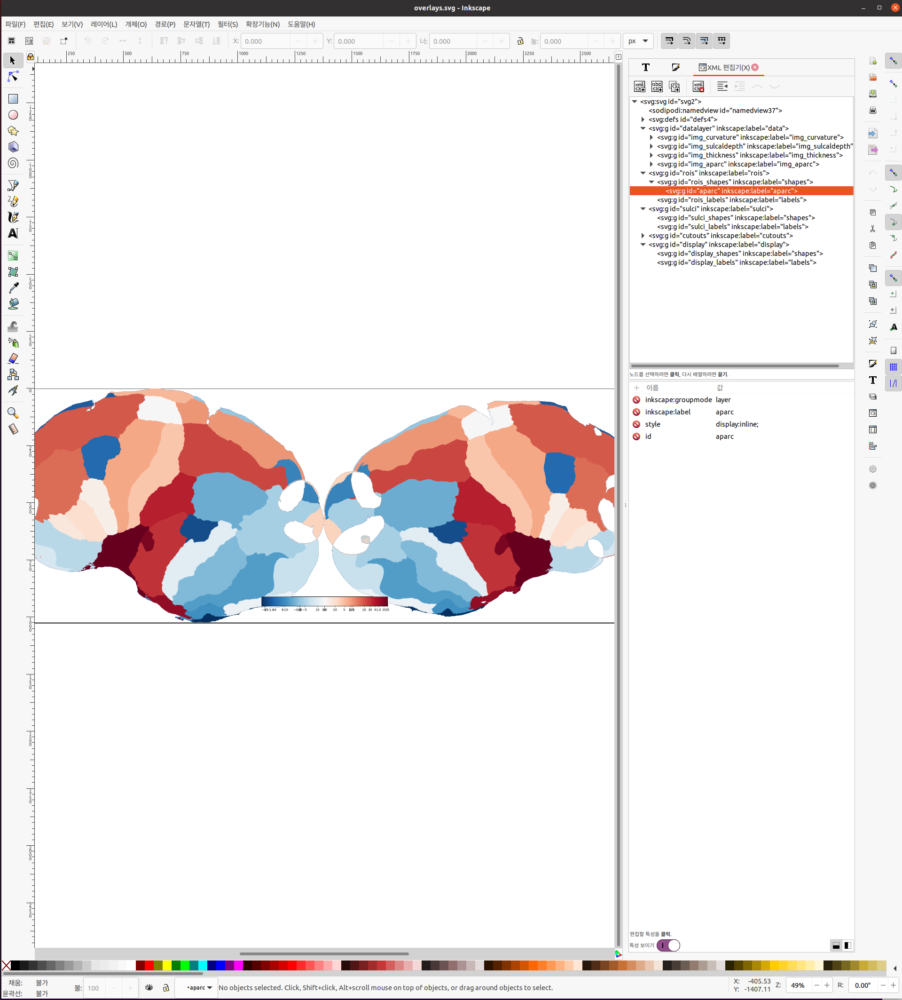

In [10]:
# Get overlays
svg = cortex.db.get_overlay(subj_name)

In [4]:
svg.rois["aparc"]

# Draw ROI

You can enter the xml source using Edit - XML Edit  
Draw ROI and grouping using the shortcut "ctrl + G"  
Click the object and select object property. and add label and id  

In this example, I add the ROI which name is new.  
<svg:g> format must place under the rois_shapes group.  

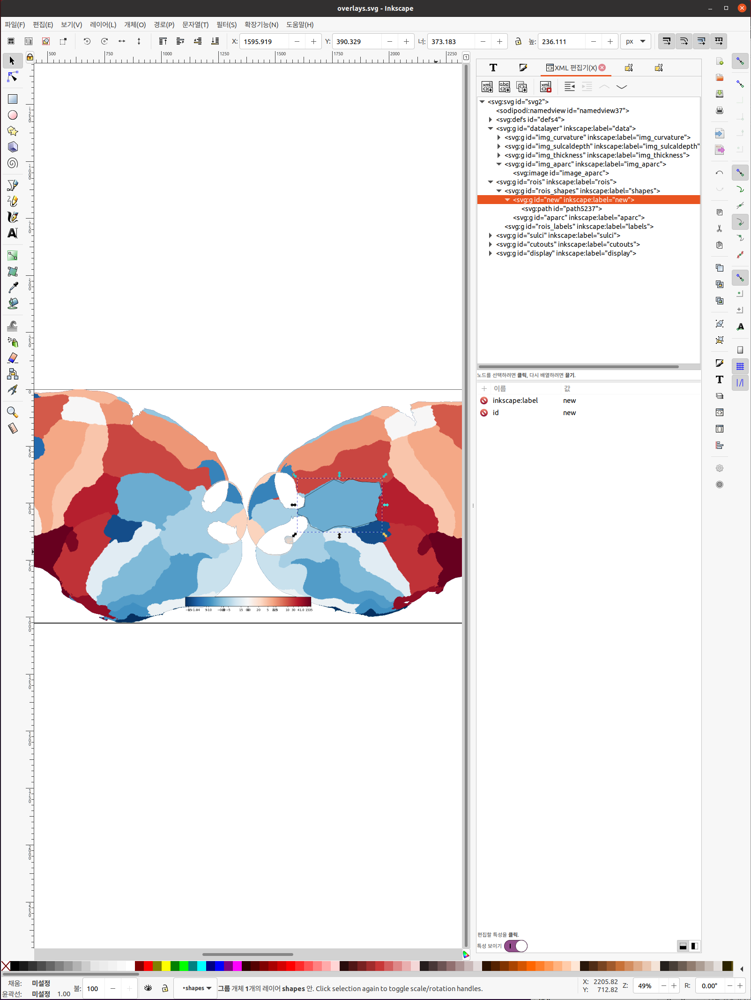

## ROI - label

You can define ROi using label either.

You can extract roi from annotation. ref: https://surfer.nmr.mgh.harvard.edu/fswiki/mri_annotation2label

ex)
mri_annotation2label --subject LW --hemi rh --outdir ./labels  


In [95]:
"""
run

mri_annotation2label --subject HP01 --hemi lh --outdir /usr/local/freesurfer/7.2.0/subjects/HP01/label/aparc_label
mri_annotation2label --subject HP01 --hemi rh --outdir /usr/local/freesurfer/7.2.0/subjects/HP01/label/aparc_label
"""

'\nrun\n\nmri_annotation2label --subject HP01 --hemi lh --outdir /usr/local/freesurfer/7.2.0/subjects/HP01/label/aparc_label\nmri_annotation2label --subject HP01 --hemi rh --outdir /usr/local/freesurfer/7.2.0/subjects/HP01/label/aparc_label\n'

In [269]:
left, right = cortex.db.get_surf(subj_name, "flat", "both")
lpts, lpolys = left
rpts, rpolys = right

In [270]:
aparc_label_dir_path = "/usr/local/freesurfer/7.2.0/subjects/HP01/label/aparc_label/"

In [271]:
import subprocess 
label_files = str(subprocess.check_output(["ls", aparc_label_dir_path]), "utf-8").split("\n")

In [272]:
roi_names = []
for label_file in label_files:
    if len(label_file) >= 1:
        hemishphere, roi_name, label = label_file.split(".")

        roi_names.append(roi_name)
        
roi_names = np.unique(roi_names)

In [273]:
roi_names

array(['bankssts', 'caudalanteriorcingulate', 'caudalmiddlefrontal',
       'cuneus', 'entorhinal', 'frontalpole', 'fusiform',
       'inferiorparietal', 'inferiortemporal', 'insula',
       'isthmuscingulate', 'lateraloccipital', 'lateralorbitofrontal',
       'lingual', 'medialorbitofrontal', 'middletemporal', 'paracentral',
       'parahippocampal', 'parsopercularis', 'parsorbitalis',
       'parstriangularis', 'pericalcarine', 'postcentral',
       'posteriorcingulate', 'precentral', 'precuneus',
       'rostralanteriorcingulate', 'rostralmiddlefrontal',
       'superiorfrontal', 'superiorparietal', 'superiortemporal',
       'supramarginal', 'temporalpole', 'transversetemporal'],
      dtype='<U24')

In [274]:
need_roi = ["precentral", 
            "postcentral", 
            "fusiform", 
            "lingual", 
            "superiorparietal", 
            "superiorfrontal", 
            "superiortemporal", 
            "supramarginal", 
            "transversetemporal", 
            "caudalmiddlefrontal"] 

In [275]:
color_i = 1
for roi_name in need_roi:
    lh_pts = lpts.shape[0]
    rh_pts = rpts.shape[0]
    
    lh_roi_file_name = sj_file_system.str_join(["lh", roi_name, "label"], ".")
    rh_roi_file_name = sj_file_system.str_join(["rh", roi_name, "label"], ".")
    
    # load label
    lh_label = nb.freesurfer.io.read_label(os.path.join(aparc_label_dir_path, lh_roi_file_name))
    rh_label = nb.freesurfer.io.read_label(os.path.join(aparc_label_dir_path, rh_roi_file_name))
    
    # set data
    lh_array = np.zeros(lh_pts)
    lh_array[lh_label] = color_i

    rh_array = np.zeros(rh_pts)
    rh_array[rh_label] = color_i
    
    # Vertex
    V = cortex.dataset.Vertex(np.r_[lh_array, rh_array], subj_name)
    
    # add ROI
    cortex.add_roi(V, name = roi_name, open_inkscape=False)
    
    color_i += 1

cortex.svgoverlay /home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP01/overlays.svg
cortex.svgoverlay /home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP01/overlays.svg
cortex.svgoverlay /home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP01/overlays.svg
cortex.svgoverlay /home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP01/overlays.svg
cortex.svgoverlay /home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP01/overlays.svg
cortex.svgoverlay /home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP01/overlays.svg
cortex.svgoverlay /home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP01/overlays.svg
cortex.svgoverlay /home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP01/overlays.svg
cortex.svgoverlay /home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP01/overlays.svg
cortex.svgoverlay /home/seojin/anaconda3/envs/seojin/share/pycortex/db/HP01/overlays.svg


## Apply data On Surface

In [17]:
fmri_reference

'/mnt/sdb2/seojin/HR/exp_blueprint_0324v4/fMRI_data/output/HP01/others/reference_img.nii'

In [18]:
reference_img_shape = nb.load(fmri_reference).shape

In [246]:
test_data = np.random.rand(reference_img_shape[0], reference_img_shape[1], reference_img_shape[2]) # np.ones(reference_img_shape)
test_data.shape

# Volume data
vol_data = cortex.Volume(data = test_data, subject = subj_name, xfmname = xfm_name)

In [253]:
view = cortex.webshow(data = vol_data, port = port)
None

Started server on port 16006
Stopping server


Unable to init server: 연결할 수 없습니다: 연결이 거부됨
** (inkscape:953068): WARNING **: 21:12:39.143: 파일 형식 자동인식 실패, SVG형식으로 파일을 읽습니다.
Background RRGGBBAA: ffffff00
Area 0:0:2760.46:1024 exported to 2760 x 1024 pixels (96 dpi)
Unable to init server: 연결할 수 없습니다: 연결이 거부됨
** (inkscape:953230): WARNING **: 21:13:08.076: 파일 형식 자동인식 실패, SVG형식으로 파일을 읽습니다.
Background RRGGBBAA: ffffff00
Area 0:0:2760.46:1024 exported to 2760 x 1024 pixels (96 dpi)
Unable to init server: 연결할 수 없습니다: 연결이 거부됨
** (inkscape:953392): WARNING **: 21:13:20.595: 파일 형식 자동인식 실패, SVG형식으로 파일을 읽습니다.
Background RRGGBBAA: ffffff00
Area 0:0:2760.46:1024 exported to 2760 x 1024 pixels (96 dpi)


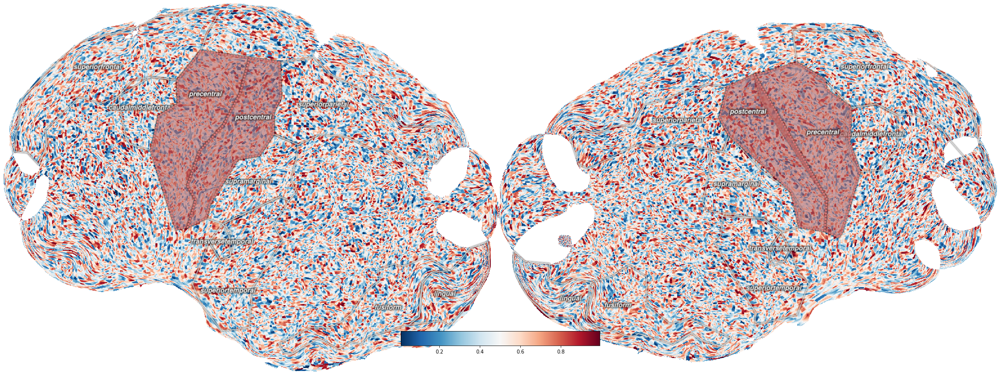

In [277]:
fig = cortex.quickflat.make_figure(vol_data,
                                   with_curvature=False,
                                   with_rois=True,
                                   with_labels=True,
                                   with_sulci=False)


_ = cortex.quickflat.composite.add_rois(fig, vol_data,
                                        roi_list=["precentral"], 
                                        with_labels=True,
                                        linewidth=5,
                                        linecolor=(0.9, 0.5, 0.5),
                                        roifill=(0.9, 0.5, 0.5),
                                        fillalpha=0.35,
                                        dashes=(5, 3)                    
                                        )

_ = cortex.quickflat.composite.add_rois(fig, vol_data,
                                        roi_list=["postcentral"], 
                                        with_labels=True,
                                        linewidth=5,
                                        linecolor=(0.9, 0.5, 0.5),
                                        roifill=(0.9, 0.5, 0.5),
                                        fillalpha=0.35,
                                        dashes=(5, 3)                   
                                        )
